In [1]:
%load_ext autoreload 
%autoreload 2
%matplotlib inline

import torchvision.transforms.v2 as v2
import dl_toolbox.datasets as datasets
from pathlib import Path
from dl_toolbox.utils import show_classifications, show_detections, show_segmentations
import random


### xView 1

In [2]:
tf = v2.Compose(
    [
        v2.SanitizeBoundingBoxes(),
        v2.RandomHorizontalFlip(p=0.5),
        v2.RandomVerticalFlip(p=0.5),
    ]
)

path = Path('/data/XVIEW1')
xview = datasets.xView1(
    path/'train_images',
    path/'xView_train.json',
    transforms=tf,
    merge='building'
)
L = len(xview)
print(xview.ids)
elem = xview[random.choice(range(L))]
show_detections([elem['image']], [elem['target']], class_list=xview.class_list)

TypeError: __init__() missing 1 required positional argument: 'ids'

### COCO

loading annotations into memory...
Done (t=9.80s)
creating index...
index created!
5990


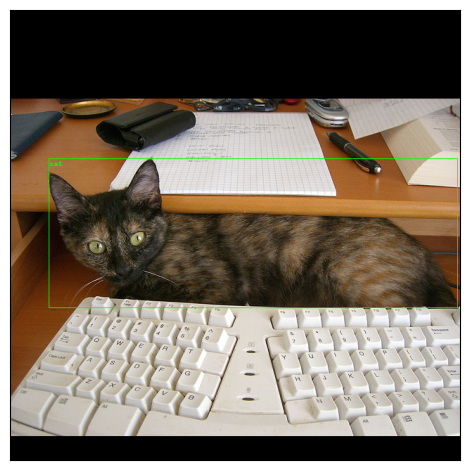

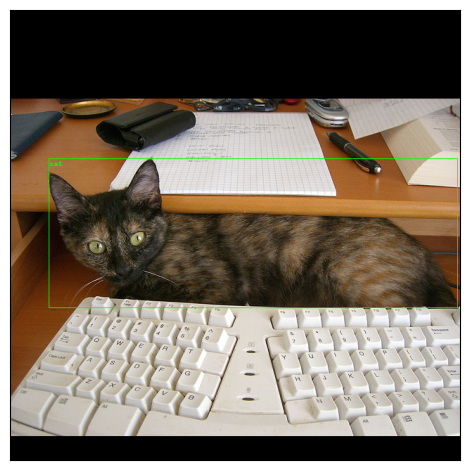

In [4]:
tf = v2.Compose(
    [
        v2.Resize(size=480, max_size=640),
        v2.RandomCrop(size=(640,640), pad_if_needed=True, fill=0),
        v2.SanitizeBoundingBoxes(),
        #v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]
)

path = Path('/data/coco')
coco = datasets.Coco(
    path/"train2017",
    path/"annotations/instances_train2017.json",
    transforms=tf,
    merge='mouse_cat'
)
print(len(coco))

elem = coco[random.choice(range(len(coco)))]
show_detections([elem['image']], [elem['target']], class_list=coco.class_list)

### AIRS

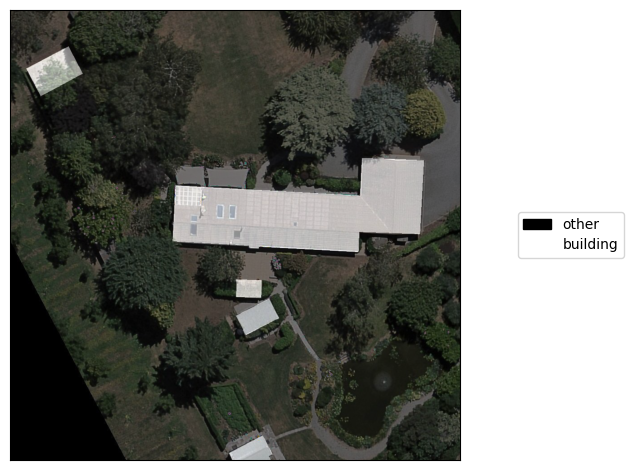

In [3]:
imgs = ['/data/AIRS/trainval/train/image/christchurch_26.tif']
msks = ['/data/AIRS/trainval/train/label/christchurch_26.tif']
windows = [(0, 0, 1000, 1000)]

tf = v2.Compose(
    [
        v2.RandomCrop(1000),
    ]
)

airs = datasets.Airs(
    imgs=imgs,
    msks=msks,
    windows=windows,
    bands=[1,2,3],
    merge='building',
    transforms=tf
)

item = airs[0]
show_segmentations(
    [item['image']],
    [item['target']],
    classes=airs.class_list,
    alpha=0.5
)

### Infinigen

In [ ]:
from dl_toolbox.datasets.infinigen.dataset_loader import get_infinigen_dataset
dataset = get_infinigen_dataset("outputs/my_download", data_types=["Image_png", "Depth_npy"])
print(len(dataset))
print(dataset[0].keys())

### Oxford Pets


In [44]:
import xml.etree.ElementTree as ET
name = 'Russian_Blue_17'
tree = ET.parse(f'/data/Oxford_IIIT_PET_DATASET/annotations/xmls/{name}.xml')
root = tree.getroot()
image = f'/data/Oxford_IIIT_PET_DATASET/images/{name}.jpg' 
xmin = int(root.find('object').find('bndbox').find('xmin').text)
ymin = int(root.find('object').find('bndbox').find('ymin').text)
xmax = int(root.find('object').find('bndbox').find('xmax').text)
ymax = int(root.find('object').find('bndbox').find('ymax').text)

In [49]:
from xml.etree.ElementTree import Element as ET_Element
import collections
try:
    from defusedxml.ElementTree import parse as ET_parse
except ImportError:
    from xml.etree.ElementTree import parse as ET_parse

def parse_voc_xml(node):
    voc_dict = {}
    children = list(node)
    if children:
        def_dic= collections.defaultdict(list)
        for dc in map(parse_voc_xml, children):
            for ind, v in dc.items():
                def_dic[ind].append(v)
        if node.tag == "annotation":
            def_dic["object"] = [def_dic["object"]]
        voc_dict = {node.tag: {ind: v[0] if len(v) == 1 else v for ind, v in def_dic.items()}}
    if node.text:
        text = node.text.strip()
        if not children:
            voc_dict[node.tag] = text
    return voc_dict

In [50]:
parse_voc_xml(ET_parse(f'/data/Oxford_IIIT_PET_DATASET/annotations/xmls/{name}.xml').getroot())

{'annotation': {'folder': 'OXIIIT',
  'filename': 'Russian_Blue_17.jpg',
  'source': {'database': 'OXFORD-IIIT Pet Dataset',
   'annotation': 'OXIIIT',
   'image': 'flickr'},
  'size': {'width': '500', 'height': '375', 'depth': '3'},
  'segmented': '0',
  'object': [{'name': 'cat',
    'pose': 'Frontal',
    'truncated': '0',
    'occluded': '0',
    'bndbox': {'xmin': '22', 'ymin': '1', 'xmax': '320', 'ymax': '276'},
    'difficult': '0'}]}}

### Penn Fudan

In [6]:
import os
import numpy as np
import torch
import matplotlib.pyplot as plt

import torchvision.transforms.functional as F


ASSETS_DIRECTORY = "../assets"

plt.rcParams["savefig.bbox"] = "tight"


def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

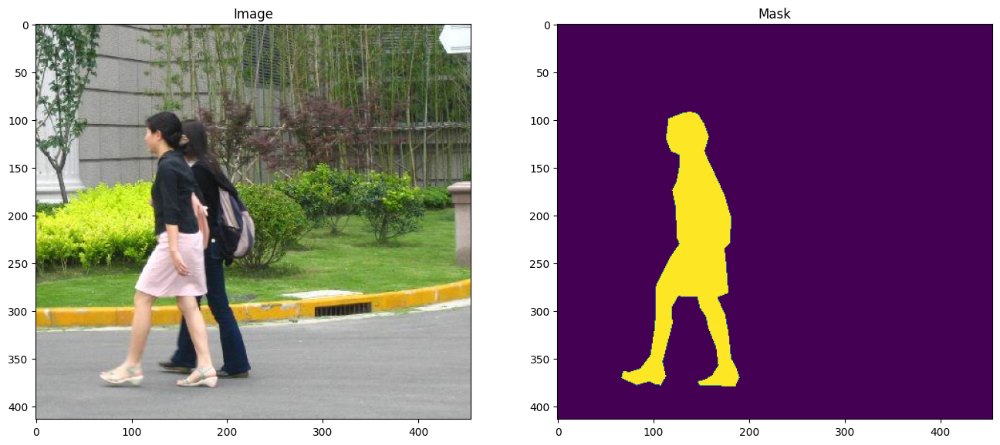

In [7]:
import matplotlib.pyplot as plt
from torchvision.io import read_image


image = read_image("/data/PennFudanPed/PNGImages/FudanPed00002.png")
mask = read_image("/data/PennFudanPed/PedMasks/FudanPed00002_mask.png")

plt.figure(figsize=(16, 8))
plt.subplot(121)
plt.title("Image")
plt.imshow(image.permute(1, 2, 0))
plt.subplot(122)
plt.title("Mask")
plt.imshow(mask.permute(1, 2, 0))

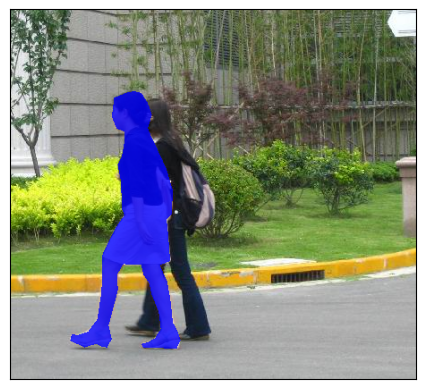

In [8]:
from torchvision.ops.boxes import masks_to_boxes
import torch

image = read_image("/data/PennFudanPed/PNGImages/FudanPed00002.png")
mask = read_image("/data/PennFudanPed/PedMasks/FudanPed00002_mask.png")
obj_ids = torch.unique(mask)
obj_ids = obj_ids[1:]
masks = (mask == obj_ids[:, None, None])#.to(dtype=torch.uint8)
from torchvision.utils import draw_segmentation_masks

drawn_masks = []
for mask in masks:
    drawn_masks.append(draw_segmentation_masks(image, mask, alpha=0.8, colors="blue"))

show(drawn_masks)

torch.Size([1, 4])
tensor([[ 67.,  92., 190., 379.]])


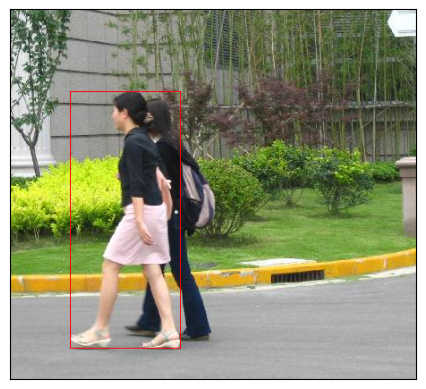

In [13]:
from torchvision.ops import masks_to_boxes

boxes = masks_to_boxes(masks)
print(boxes.size())
print(boxes)
from torchvision.utils import draw_bounding_boxes

drawn_boxes = draw_bounding_boxes(image, boxes, colors="red")
show(drawn_boxes)

### Testing Semcity

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


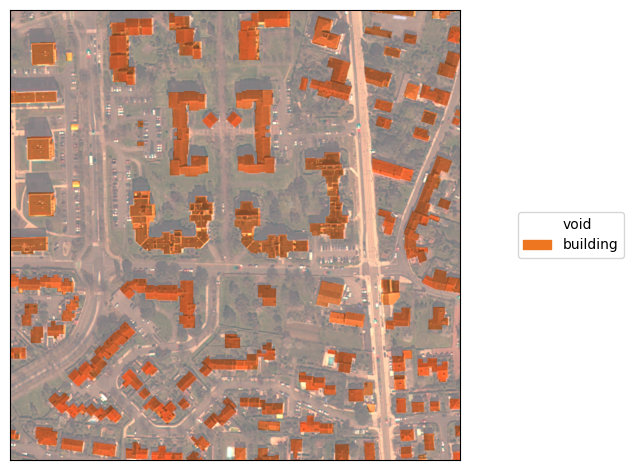

In [2]:
imgs = ['/data/SemCity-Toulouse-bench/img_multispec_05/TLS_BDSD_M/TLS_BDSD_M_01.tif'] * 4
msks = ['/data/SemCity-Toulouse-bench/semantic_05/TLS_indMap/TLS_indMap_01_1.tif'] * 4
windows = [(0, 0, 876, 863), (0, 876, 876, 863), (0, 1752, 876, 863), (0, 2589, 876, 863)]


tf = v2.Compose(
    [
        v2.RandomCrop(800),
    ]
)

semcity = datasets.Semcity(
    imgs=imgs,
    msks=msks,
    windows=windows,
    bands=[4,3,2],
    merge='building',
    transforms=tf
)

item = semcity[0]
show_segmentations(
    [item['image']],
    [item['target']],
    classes=semcity.class_list,
    alpha=0.4
)

### Testing Flair

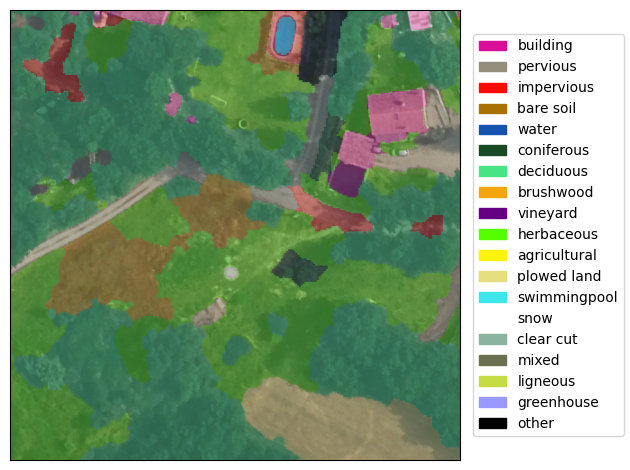

In [9]:
tf = v2.Compose(
    [
        v2.RandomCrop(500),
        #v2.SanitizeBoundingBoxes(),
    ]
)

flair = Path('/data/FLAIR_1/train')
imgs = [flair/'D004_2021/Z10_AU/img/IMG_000826.tif',
        flair/'D004_2021/Z10_AU/img/IMG_000827.tif']
msks = [flair/'D004_2021/Z10_AU/msk/MSK_000826.tif',
        flair/'D004_2021/Z10_AU/msk/MSK_000827.tif']

merge = 'all19'
flair = datasets.Flair(
    imgs=imgs,
    msks=msks,
    bands=[1,2,3],
    merge='all19',
    transforms=tf
)

item = flair[1]
show_segmentations(
    [item['image']],
    [item['target']],
    classes=flair.class_list,
    alpha=0.3
)

### Testing cityscapes

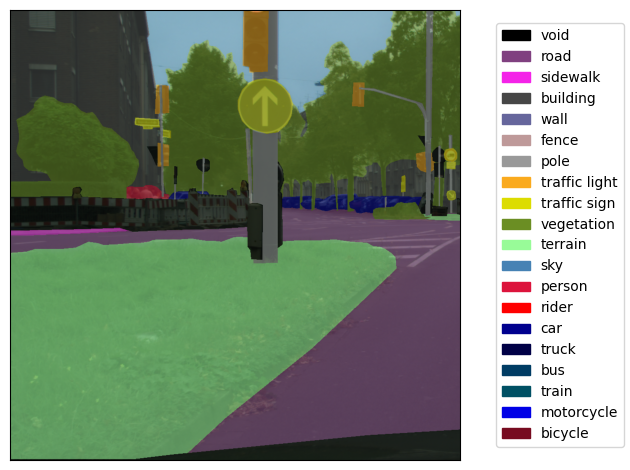

In [2]:
imgs = ['/data/Cityscapes/leftImg8bit/train/dusseldorf/dusseldorf_000000_000019_leftImg8bit.png',
        '/data/Cityscapes/leftImg8bit/train/dusseldorf/dusseldorf_000001_000019_leftImg8bit.png']
msks = ['/data/Cityscapes/gtFine/train/dusseldorf/dusseldorf_000000_000019_gtFine_labelIds.png',
        '/data/Cityscapes/gtFine/train/dusseldorf/dusseldorf_000001_000019_gtFine_labelIds.png']

tf = v2.Compose(
    [
        v2.RandomCrop(1000)
    ]
)

cityscapes = datasets.Cityscapes(
    imgs=imgs,
    msks=msks,
    merge='all19',
    transforms=tf,
)

item = cityscapes[0]
show_segmentations(
    [item['image']],
    [item['target']],
    classes=cityscapes.class_list,
    alpha=0.5
)

### Testing Resisc

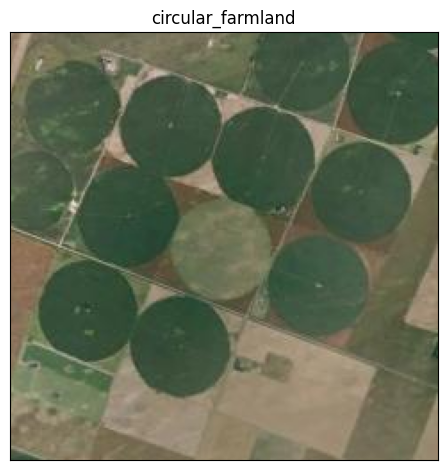

In [2]:
tf = v2.Compose(
    [
        v2.RandomCrop(240)
    ]
)

resisc = datasets.Resisc(
    data_path='/data/NWPU-RESISC45',
    transforms=tf,
    merge='all45'
)

item = resisc[5688]
show_classifications(
    [item['image']],
    [item['target']],
    class_list=resisc.class_list
)

### Testing Rellis-3D

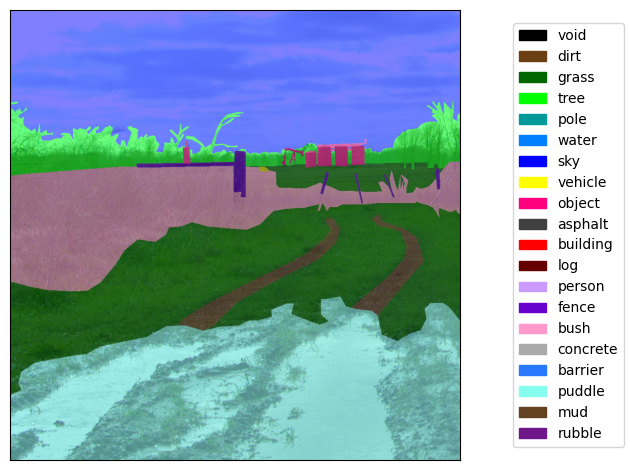

In [3]:
tf = v2.Compose(
    [
        v2.RandomCrop(1000)
    ]
)

rellis = Path('/data/Rellis-3D')
imgs = [rellis/'00000/pylon_camera_node/frame000000-1581624652_750.jpg']
msks = [rellis/'00000/pylon_camera_node_label_id/frame000000-1581624652_750.png']
    
rellis = datasets.Rellis3d(
    imgs=imgs,
    msks=msks,
    merge='all20',
    transforms=tf
)

item = rellis[0]
show_segmentations(
    [item['image']],
    [item['target']],
    classes=rellis.class_list,
    alpha=0.5
)

### Testing semantic drone dataset

max val in image : 1.0
max val in label : 22


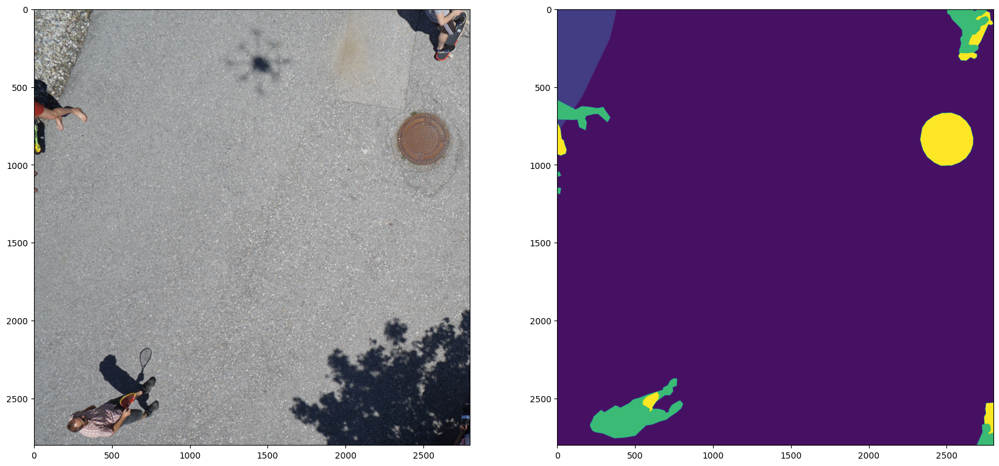

In [4]:
from pathlib import Path
ds = '/data/semantic_drone_dataset'
ds_imgs_path = Path(ds + '/training_set/images')
ds_imgs = ds_imgs_path.glob('*.jpg')
ds_imgs = sorted(ds_imgs, key=lambda x: int(x.stem))
ds_msks_path = Path(ds+'/training_set/gt/semantic/label_images')
ds_msks = ds_msks_path.glob('*.png')
ds_msks = sorted(ds_msks, key=lambda x: int(x.stem))
     
dataset = datasets.SemanticDrone(
    imgs=ds_imgs,
    msks=ds_msks,
    merge='all23',
    transforms=tf.StretchToMinmax(minval=[0]*3, maxval=[255.]*3),
)

show_dataset(dataset)

### Testing Digitanie

max val in image : 1.0
max val in label : 9


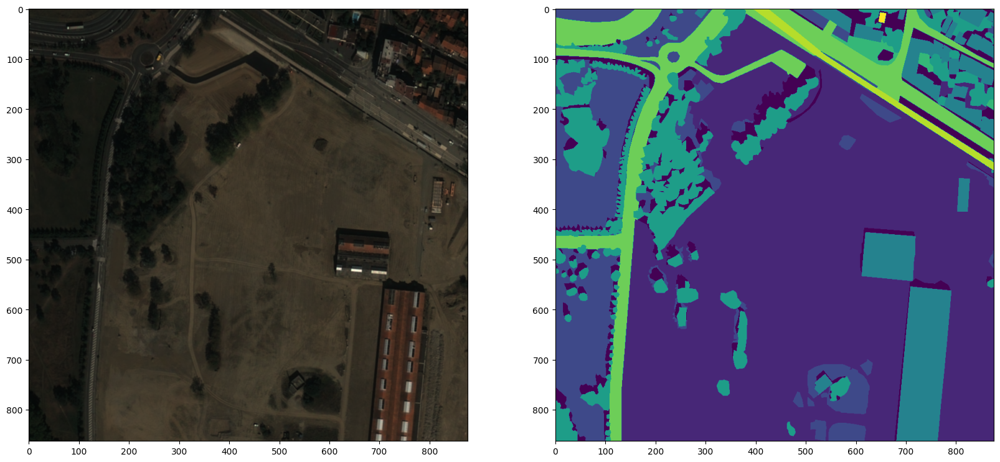

In [10]:
from pathlib import Path
digitanie = Path('/work/AI4GEO/data/DATA/DATASETS/DIGITANIE_v4')
toulouse = digitanie / 'TOULOUSE'
imgs = list(toulouse.glob('*16bits_COG_*.tif'))
imgs = sorted(imgs, key=lambda x: int(x.stem.split('_')[-1]))
msks = list(toulouse.glob('COS9/*.tif'))
msks = sorted(msks, key=lambda x: int(x.stem.split('_')[-2]))
windows = [(0, 0, 876, 863)] * 10

     
dataset = datasets.Digitanie(
    imgs=imgs,
    msks=msks,
    windows=windows,
    bands=[1,2,3],
    merge='all9',
    transforms=tf.StretchToMinmax([0]*3, [8000.]*3),
)

show_dataset(dataset)

### DIGITANIE TOA

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
0.882125


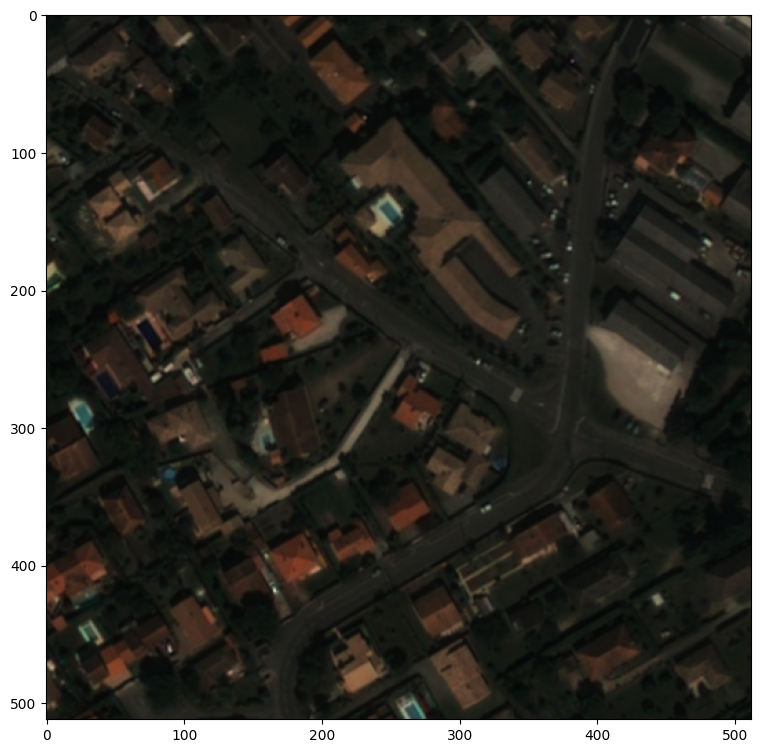

In [5]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import dl_toolbox.transforms as transforms
from dl_toolbox.datasets import DigitanieUnlabeledToa
from pathlib import Path
from dl_toolbox.utils import get_tiles
import shapely
import rasterio.windows as W
import rasterio
import dl_toolbox.transforms as tf

digi = Path('/work/AI4GEO/data/DATA/DATASETS/DIGITANIE_v4')
toa = next((digi/'TOULOUSE').glob('*COG.tif'))

city_poly = shapely.Polygon(
    [
        [359326, 4833160],
        [376735, 4842547],
        [385238, 4826271],
        [367914, 4816946],
        [359326, 4833160],
    ]
)

with rasterio.open(toa, 'r') as ds:
    city_tf = ds.transform
    windows = [w[1] for w in ds.block_windows()]

def is_window_in_poly(w, tf, p):
    bbox = W.bounds(w, transform=tf)
    w_poly = shapely.geometry.box(*bbox)
    return w_poly.within(p)

filtered_windows = [w for w in windows if is_window_in_poly(w,city_tf,city_poly)]

dataset = DigitanieUnlabeledToa(
    toa=toa,
    bands=[1,2,3],
    transforms=tf.StretchToMinmax([0]*3, [8000.]*3),
    windows=filtered_windows
)

x = dataset[200]
image=x['image'].numpy().transpose(1,2,0)[...,:3]
print(np.max(image))

%matplotlib inline

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(121)
ax1.imshow(image)

### DIGITANIE PNEO

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
1.0
8 (512, 512)


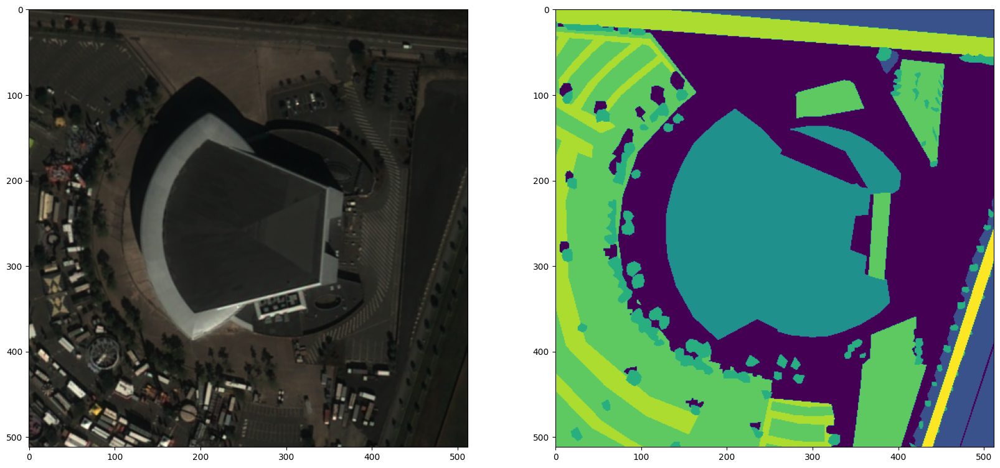

In [4]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import dl_toolbox.transforms as transforms
from dl_toolbox.datasets import DigitanieSublabeledToa
from pathlib import Path
from dl_toolbox.utils import get_tiles
import shapely
import rasterio.windows as W
import rasterio

digi = Path('/work/AI4GEO/data/DATA/DATASETS/DIGITANIE_v4')
toulouse = digi / 'TOULOUSE'
msks = list(toulouse.glob('COS9/*.tif'))
msks = sorted(msks, key=lambda x: int(x.stem.split('_')[-2]))
toa = next((digi/'TOULOUSE').glob('*COG.tif'))

dataset = DigitanieSublabeledToa(
    toa=toa,
    msks=msks,
    merge='all9',
    bands=[1,2,3],
    transforms=tf.StretchToMinmax(minval=[0]*3, maxval=[8000.]*3),
)

x = dataset[2]
image=x['image'].numpy().transpose(1,2,0)[...,:3]
label=x['label'].numpy()
print(np.max(image))
print(np.max(label), label.shape)

%matplotlib inline

fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax1.imshow(image)
ax2.imshow(label)

### Testing Digitanie Pseudosup

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
10


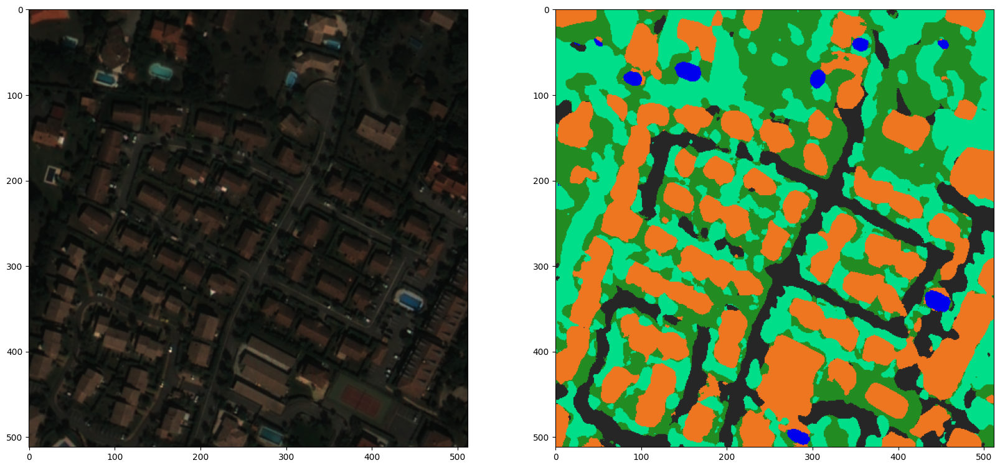

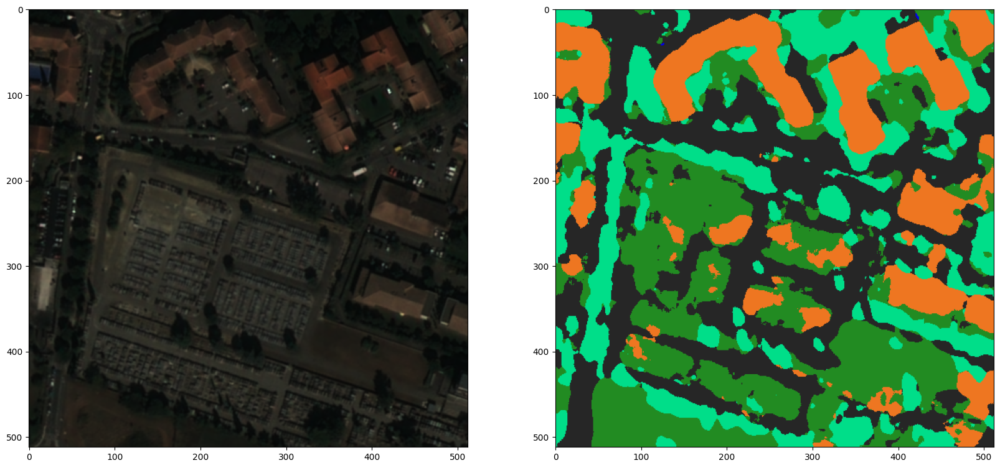

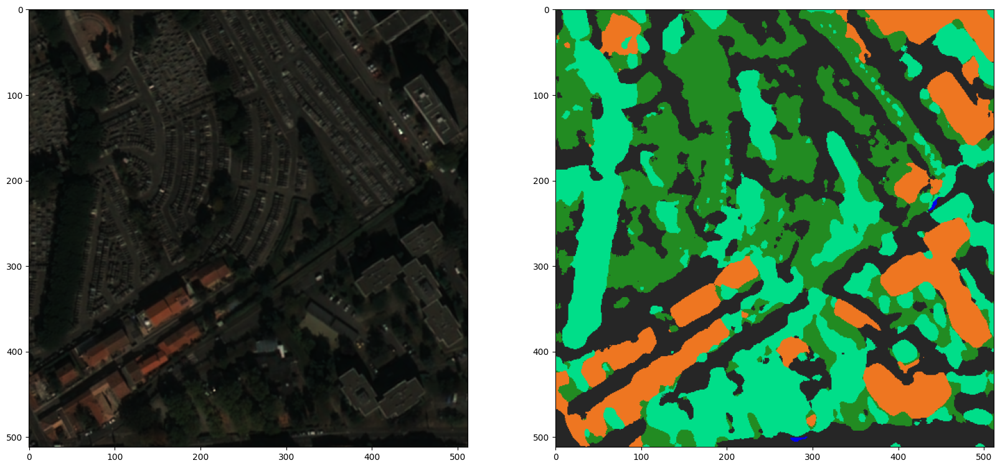

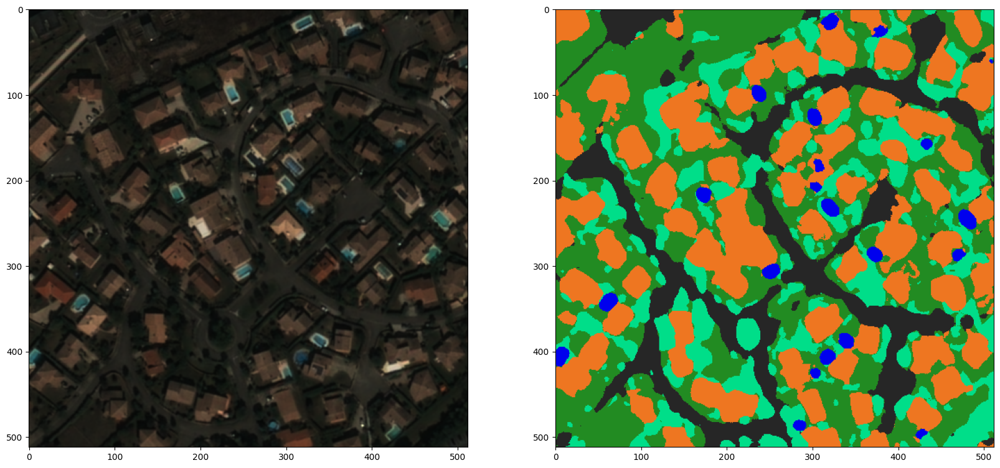

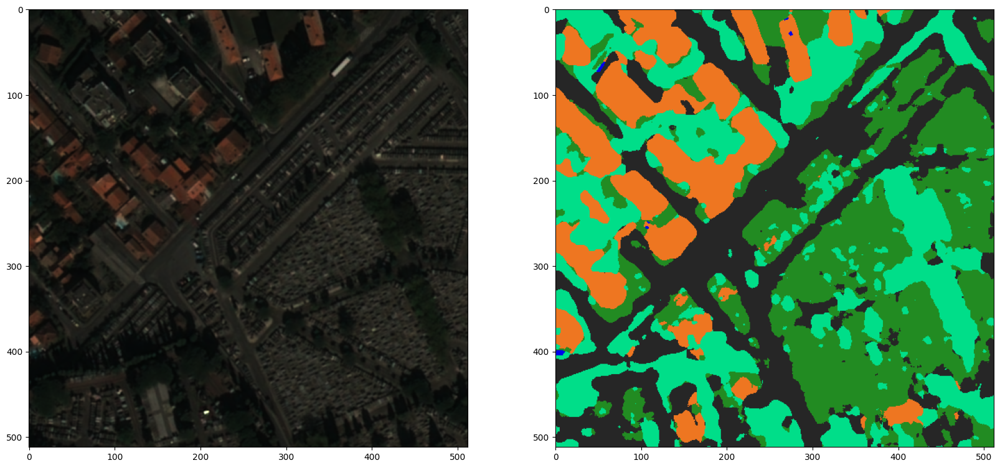

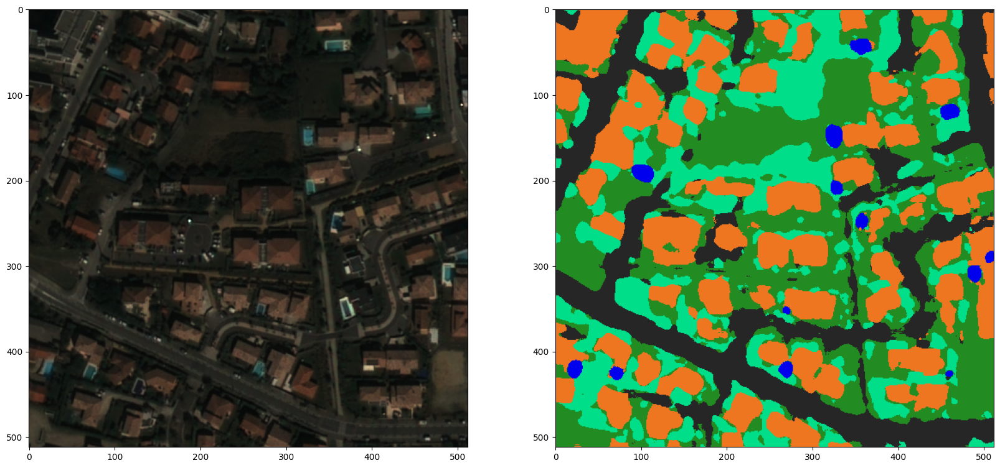

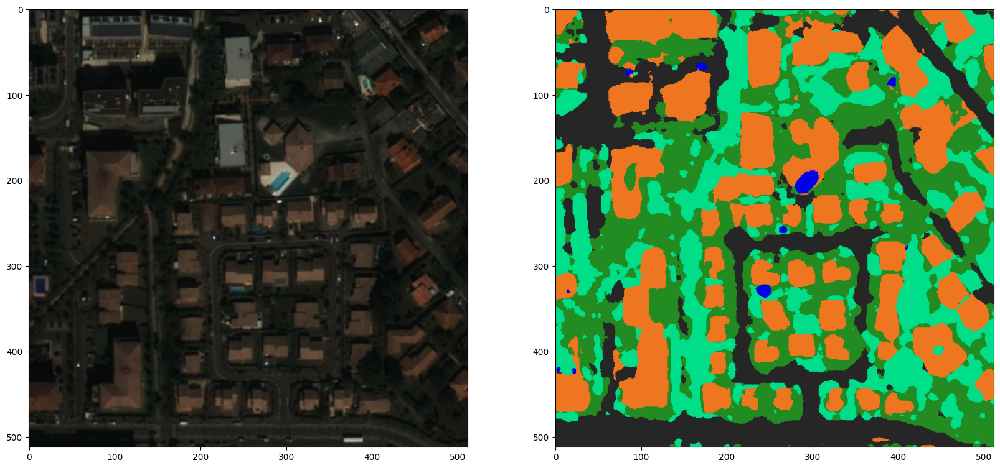

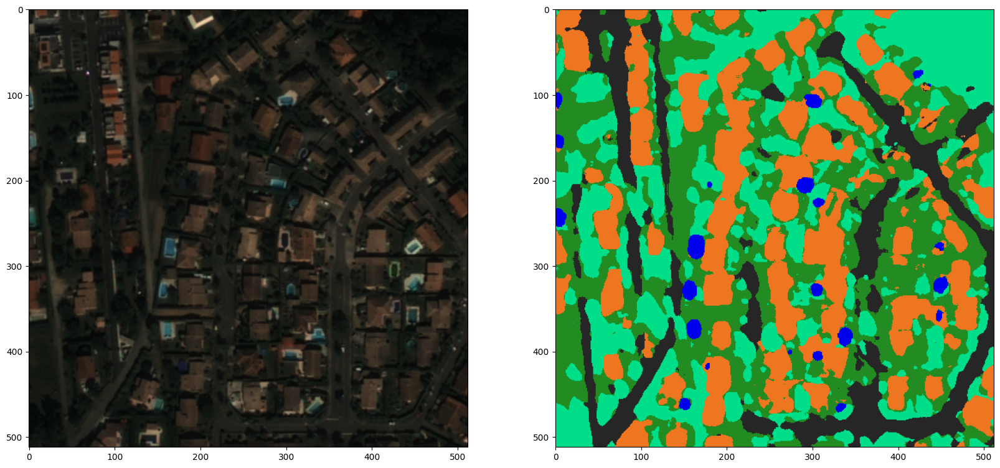

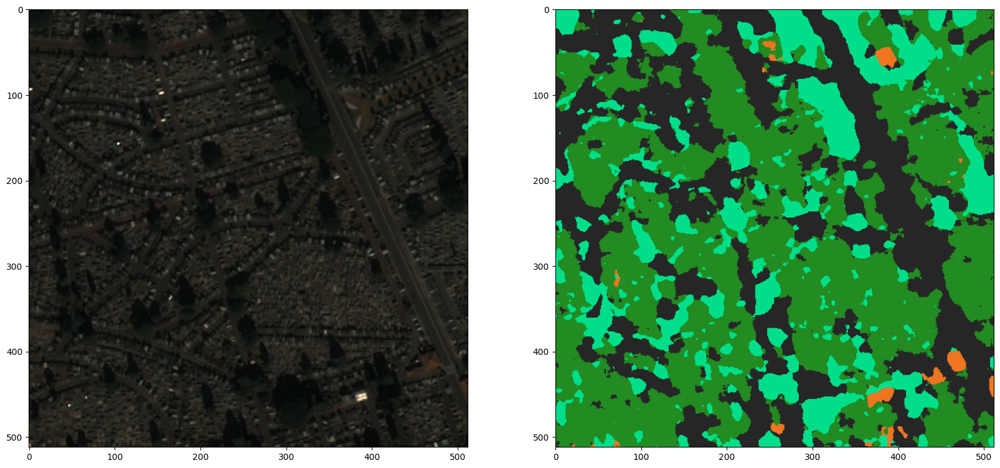

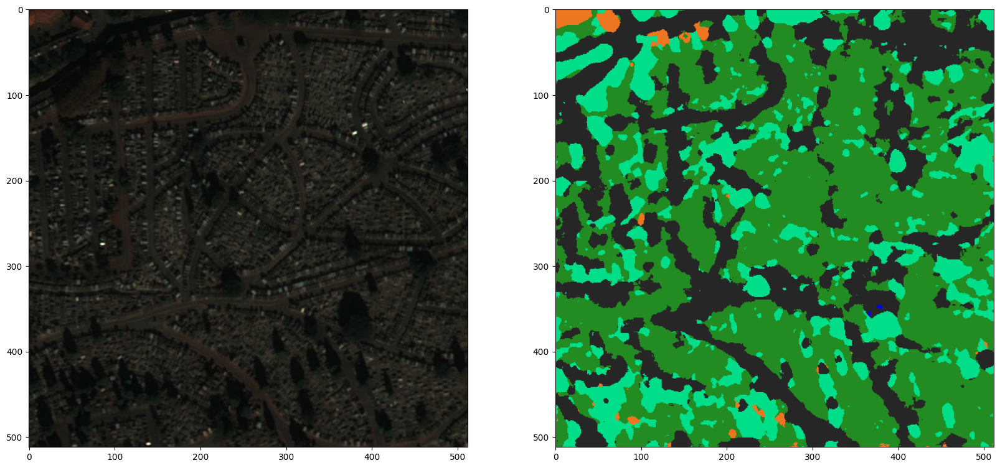

In [12]:
from pathlib import Path
%load_ext autoreload
%autoreload 2
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import dl_toolbox.transforms as tf
import dl_toolbox.datasets as datasets
from dl_toolbox.utils import labels_to_rgb

def show_dataset(dataset):
    for i in range(10):
        item = dataset[i]
        image=item['image'].numpy().transpose(1,2,0)[...,:3]
        classes = datasets.Digitanie.classes['main5'].value
        label=labels_to_rgb(item['label'], colors=[(i, l.color) for i, l in enumerate(classes)])
        fig = plt.figure(figsize=(20,20))
        ax1 = fig.add_subplot(121)
        ax2 = fig.add_subplot(122)
        ax1.imshow(image)
        ax2.imshow(label)
    
import pandas as pd
import random
stats = pd.read_csv('/work/AI4GEO/users/fournip/outputs/test_ohem/2023-10-27_143004/0/checkpoints/epoch_180/stats.csv', index_col=0)
stats.sort_values('avg_cert', ascending=False, inplace=True)
stats = stats.iloc[range(-10,0)]
#stats = stats.iloc[random.sample(range(1680), 10)]
#print(stats['avg_cert'])

data_path = Path('/work/AI4GEO/data/DATA/DATASETS')
pl_dir = Path('/work/AI4GEO/users/fournip/outputs/test_ohem/2023-10-27_143004/0/checkpoints/epoch_180')

dataset = datasets.DigitaniePseudosup(
    [data_path/img for img in list(stats['img'])],
    [pl_dir/img for img in list(stats['msk'])],
    [tuple(int(i) for i in win.split('_')) for win in list(stats['win'])],
    [1,2,3],
    transforms=tf.To_0_1([0]*3, [8000.]*3)
)
print(len(dataset))
show_dataset(dataset)

[822, 1292, 1363, 1106, 390, 1404, 842, 1307, 1112, 753]